# **27. Stable Diffusion, 너 Do? 나 Do! [프로젝트]**

## **27-1. Project: Stable diffusion 실습**

오늘은 Stable diffusion에 대해서 살펴보았습니다.<br>
이미지 생성 모델을 더 효율적으로 구성하기 위해, 의미적인 공간을 적극적으로 활용한 latent diffusion model 구조를 상세하게 이해해보았습니다.<br>
또한, Huggingface의 예제 코드를 사용하여, 부분적인 미세 조정 과정도 직접 실습해보았고,<br>
웹 상에 공개된 checkpoint와 LoRA를 활용하여 이 세상에 없던 나만의 이미지를 생성해보았습니다.<br>
<br>
이러한 과정들은 현재도 실시간으로 왕성하게 발전되고 있는 분야이면서, 동시에 여러 논란거리를 우리에게 안겨주고 있습니다.<br>
학습에 필요한 데이터와 연관된 저작권 문제와 더불어, 생성 이미지 결과물 자체가 사회에 미치는 윤리적인 문제들이 산재하고 있다는 사실을 꼭 기억해주세요.<br>
<br>
그럼에도 불구하고 엄청난 가능성이 담긴 세계가 새롭게 펼쳐지고 있는것도 사실입니다.<br>
예술 산업 전반에 걸친 창작 활동 과정마다 폭발적인 생산성 도구들이 물밀듯 생겨나고 있고,<br> 우리 생활 곳곳에서 마주칠 수 있는 상품들도 어느 새 성큼 가까워져 있을지 모릅니다.<br>
<br>
여러분은 이렇게 만든 나만의 취향을 어떤 곳에, 어떤 모양으로 사용하고 싶으신가요?

### **Latent 가 어떤 변화를 만들어내는지 체험해봅시다.**
---

- [PyTorch Tutorial](https://daddynkidsmakers.blogspot.com/2024/02/ai-stable-diffusion.html)
- [Colab 실습 코드](https://gist.github.com/kspark-modulabs/1e16667d524cf6d62c30d00ddb72a714)<br><br>

그림에 대한 묘사가 담긴 텍스트 프롬프트를 활용하면, 과적합을 안정적으로 줄이면서 우리가 원하는 기준대로 이미지를 생성할 수 있을 것 같습니다.<br>
Stable diffusion 은 이러한 조건들을 잠재 공간 단위로 조정하면서 꾸준하고도 효율적인 학습과 추론을 수행할 수 있게 되었습니다.<br>
<br>
먼저 원하는 텍스트 프롬프트 4 개를 각각 설정해주세요.<br>
예제에서 제공되는 파이프라인을 재구성하여 함께 준비합니다.

```
prompt_1 = "A watercolor painting of a Golden Retriever at the beach"
prompt_2 = "A still life DSLR photo of a bowl of fruit"
prompt_3 = "The eiffel tower in the style of starry night"
prompt_4 = "An architectural sketch of a skyscraper"
```

모델을 사용해 프롬프트를 임베딩 형태로 변환하고, 선형 보간을 통해 중간 지점을 만들어 직접 시각화해보세요.<br>
잠재 공간의 매니폴드 구조를 떠올리면서 중간 지점의 생성 이미지들을 관찰하고, 눈에 띄는 이미지적 특성들을 분석하여 정리해보세요.

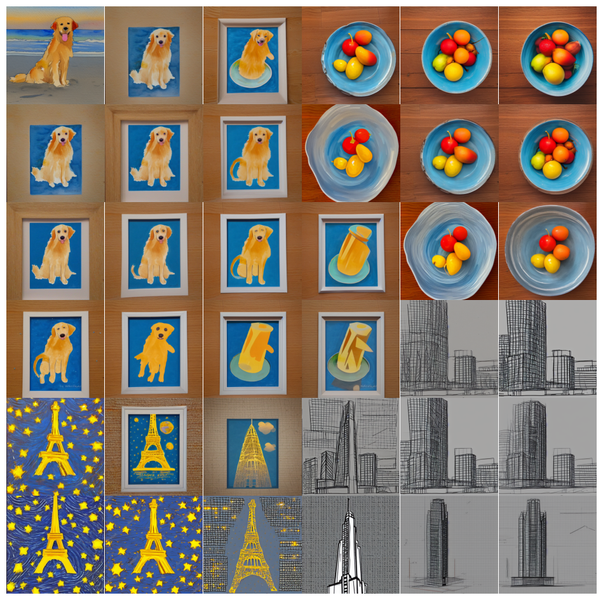

Using device: cuda


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

설정된 4개 모서리 프롬프트:
1. (0,0) 왼쪽 위: A watercolor painting of a Golden Retriever at the beach
2. (0,5) 오른쪽 위: A still life DSLR photo of a bowl of fruit
3. (5,0) 왼쪽 아래: The eiffel tower in the style of starry night
4. (5,5) 오른쪽 아래: An architectural sketch of a skyscraper

텍스트 프롬프트들을 임베딩으로 변환 중...
인코딩 형태: torch.Size([77, 768])
임베딩 변환 완료!

6x6 격자 보간 (Keras 방식)
고정된 노이즈 생성 중...
2D 보간 수행 중...
보간 격자 형태: torch.Size([6, 6, 77, 768])
6x6 격자 이미지 생성 중 (동일한 노이즈 사용)...
  이미지 (1,1)/6x6 생성 중...
  이미지 (1,2)/6x6 생성 중...
  이미지 (1,3)/6x6 생성 중...
  이미지 (1,4)/6x6 생성 중...
  이미지 (1,5)/6x6 생성 중...
  이미지 (1,6)/6x6 생성 중...
  이미지 (2,1)/6x6 생성 중...
  이미지 (2,2)/6x6 생성 중...
  이미지 (2,3)/6x6 생성 중...
  이미지 (2,4)/6x6 생성 중...
  이미지 (2,5)/6x6 생성 중...
  이미지 (2,6)/6x6 생성 중...
  이미지 (3,1)/6x6 생성 중...
  이미지 (3,2)/6x6 생성 중...
  이미지 (3,3)/6x6 생성 중...
  이미지 (3,4)/6x6 생성 중...
  이미지 (3,5)/6x6 생성 중...
  이미지 (3,6)/6x6 생성 중...
  이미지 (4,1)/6x6 생성 중...
  이미지 (4,2)/6x6 생성 중...
  이미지 (4,3)/6x6 생성 중...
  이미지 (4,4)/6x6 생성 중...
  이미지 (4,5)/6x6 

<ipython-input-2-8f745cb69fa1>:215: UserWarning: Glyph 44264 (\N{HANGUL SYLLABLE GOL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-8f745cb69fa1>:215: UserWarning: Glyph 46304 (\N{HANGUL SYLLABLE DEUN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-8f745cb69fa1>:215: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-8f745cb69fa1>:215: UserWarning: Glyph 53944 (\N{HANGUL SYLLABLE TEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-8f745cb69fa1>:215: UserWarning: Glyph 48260 (\N{HANGUL SYLLABLE BEO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-8f745cb69fa1>:215: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-8f745cb69fa1>:215: UserWarning: Glyph 52292 (\N{HANGUL SYLLABLE CAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipytho

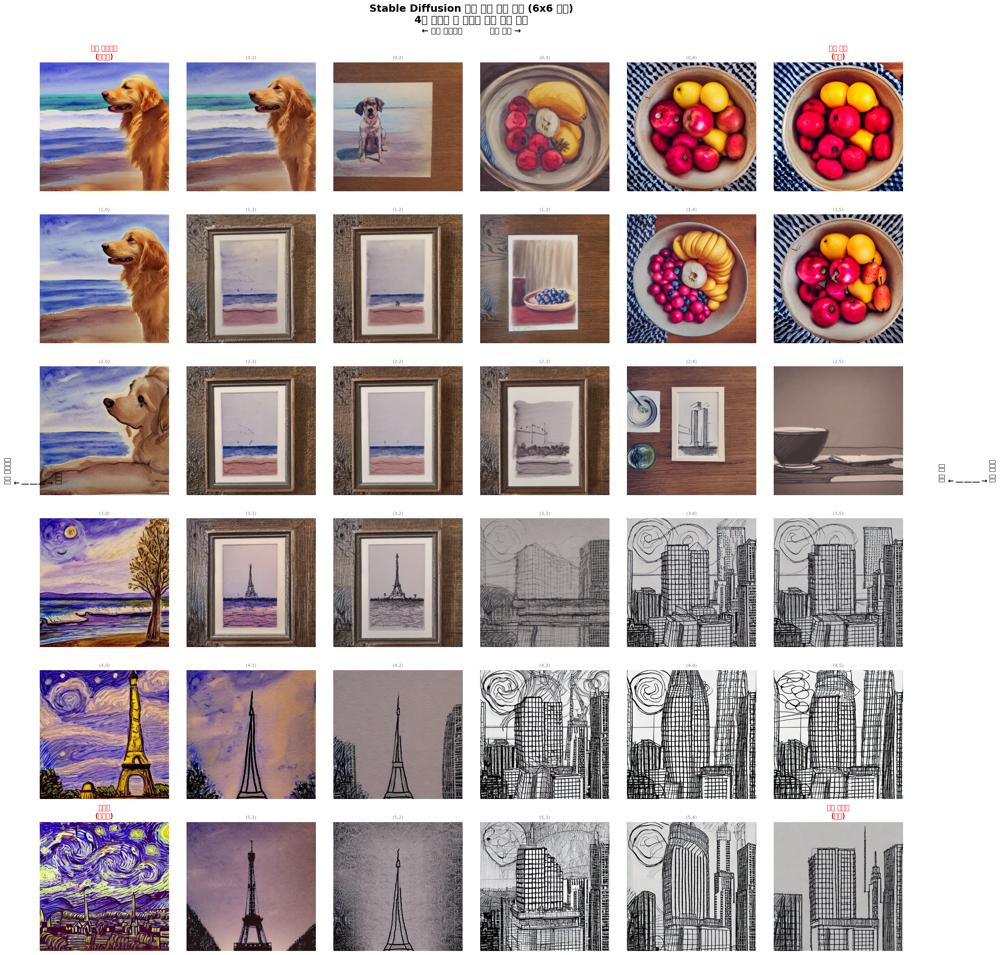


모서리 점들 위치 확인:
  (0,0): 골든 리트리버 (수채화)
  (0,5): 과일 정물 (사진)
  (5,0): 에펠탑 (인상파)
  (5,5): 건축 스케치 (선화)
  중간 지점들: 위 4개 개념의 연속적 혼합

=== 잠재 공간 보간 분석 (Keras 방식) ===
📊 구현 방식:
  - Keras 공식 예제와 동일한 방식
  - 텍스트 임베딩에서 이중 선형 보간 (ops.linspace 중첩)
  - 모든 이미지에 동일한 노이즈 사용 (seed=12345)
  - 6x6 = 36개 이미지

🔧 핵심 차이점:
  ✓ 동일한 노이즈: 텍스트 임베딩 변화만으로 인한 순수한 개념 보간
  ✓ 구조적 일관성: 모든 이미지가 동일한 기본 구조/구도 유지
  ✓ 의미적 변화: 스타일과 내용만 점진적으로 변화

🎨 각 축별 변화:
  - 수평 축 (왼쪽→오른쪽): 스타일 변화
    * 상단: 수채화 → 사진 (부드러움 → 선명함)
    * 하단: 인상파 → 스케치 (색채 → 선화)
  - 수직 축 (위→아래): 주제 변화
    * 좌측: 강아지 → 에펠탑 (유기체 → 건축물)
    * 우측: 과일 → 스케치 (정물 → 기하학)

🧠 잠재 공간의 특성:
  - 연속성: 인접한 이미지 간 급격한 변화 없음
  - 보간성: 임의의 두 점 사이 자연스러운 경로 존재
  - 구조 보존: 동일 노이즈로 기본 구도 일관성 유지
  - 창발성: 중간 지점에서 예상치 못한 흥미로운 조합 등장

실습 완료! 🎉


In [ ]:
# Stable Diffusion 잠재 공간 보간 실습 (6x6 격자)
# A walk through latent space with Stable Diffusion
# 참고: https://keras.io/examples/generative/random_walks_with_stable_diffusion/

import torch
import numpy as np
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt

# GPU 사용 설정
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Stable Diffusion 파이프라인 로드
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    safety_checker=None,
    requires_safety_checker=False
)
pipe = pipe.to(device)

# 4개의 텍스트 프롬프트 설정 (6x6 격자의 모서리 점들)
prompt_1 = "A watercolor painting of a Golden Retriever at the beach"      # 왼쪽 위 (0,0)
prompt_2 = "A still life DSLR photo of a bowl of fruit"                    # 오른쪽 위 (0,5)
prompt_3 = "The eiffel tower in the style of starry night"                 # 왼쪽 아래 (5,0)
prompt_4 = "An architectural sketch of a skyscraper"                       # 오른쪽 아래 (5,5)

prompts = [prompt_1, prompt_2, prompt_3, prompt_4]

print("설정된 4개 모서리 프롬프트:")
print(f"1. (0,0) 왼쪽 위: {prompt_1}")
print(f"2. (0,5) 오른쪽 위: {prompt_2}")
print(f"3. (5,0) 왼쪽 아래: {prompt_3}")
print(f"4. (5,5) 오른쪽 아래: {prompt_4}")

# 텍스트 인코딩 함수
def encode_text_prompt(prompt):
    """텍스트 프롬프트를 임베딩으로 변환"""
    text_inputs = pipe.tokenizer(
        prompt,
        padding="max_length",
        max_length=pipe.tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt"
    )

    with torch.no_grad():
        text_embedding = pipe.text_encoder(text_inputs.input_ids.to(device))[0]

    return text_embedding

# 2D 보간 함수 (Keras 예제와 동일한 방식)
def interpolate_2d_keras_style(enc1, enc2, enc3, enc4, steps=6):
    """Keras 예제와 동일한 방식의 2D 보간"""
    # 위쪽 행: enc1 -> enc2
    top_row = torch.stack([
        enc1 * (1 - i/(steps-1)) + enc2 * (i/(steps-1))
        for i in range(steps)
    ])

    # 아래쪽 행: enc3 -> enc4
    bottom_row = torch.stack([
        enc3 * (1 - i/(steps-1)) + enc4 * (i/(steps-1))
        for i in range(steps)
    ])

    # 세로 방향 보간: top_row -> bottom_row
    interpolated_grid = torch.stack([
        top_row * (1 - i/(steps-1)) + bottom_row * (i/(steps-1))
        for i in range(steps)
    ])

    return interpolated_grid  # shape: (steps, steps, 77, 768)

# 이미지 생성 함수 (동일한 노이즈 사용)
def generate_image_with_fixed_noise(text_embedding, fixed_noise):
    """고정된 노이즈로 이미지 생성 (Keras 예제 방식)"""
    # 배치 차원 추가 (77, 768) -> (1, 77, 768)
    if text_embedding.dim() == 2:
        text_embedding = text_embedding.unsqueeze(0)

    # Unconditional embedding (빈 프롬프트)
    uncond_tokens = pipe.tokenizer(
        "",
        padding="max_length",
        max_length=pipe.tokenizer.model_max_length,
        return_tensors="pt"
    )

    with torch.no_grad():
        uncond_embeddings = pipe.text_encoder(uncond_tokens.input_ids.to(device))[0]

    # 임베딩 결합 (CFG를 위해)
    text_embeddings_combined = torch.cat([uncond_embeddings, text_embedding])

    # 고정된 노이즈 사용 (Keras 예제처럼)
    latents = fixed_noise.clone()

    # 스케줄러 설정
    pipe.scheduler.set_timesteps(25)  # 빠른 생성을 위해 25단계
    latents = latents * pipe.scheduler.init_noise_sigma

    # 디노이징 루프
    for t in pipe.scheduler.timesteps:
        latent_model_input = torch.cat([latents] * 2)
        latent_model_input = pipe.scheduler.scale_model_input(latent_model_input, t)

        with torch.no_grad():
            noise_pred = pipe.unet(
                latent_model_input,
                t,
                encoder_hidden_states=text_embeddings_combined
            ).sample

        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + 7.5 * (noise_pred_text - noise_pred_uncond)

        latents = pipe.scheduler.step(noise_pred, t, latents).prev_sample

    # 최종 이미지 디코딩
    with torch.no_grad():
        image = pipe.vae.decode(latents / pipe.vae.config.scaling_factor).sample

    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    image = (image * 255).astype(np.uint8)

    return Image.fromarray(image[0])

# 메인 실행 코드
print("\n텍스트 프롬프트들을 임베딩으로 변환 중...")

# 4개 프롬프트 인코딩
encoding_1 = encode_text_prompt(prompt_1).squeeze(0)  # (77, 768)
encoding_2 = encode_text_prompt(prompt_2).squeeze(0)
encoding_3 = encode_text_prompt(prompt_3).squeeze(0)
encoding_4 = encode_text_prompt(prompt_4).squeeze(0)

print(f"인코딩 형태: {encoding_1.shape}")
print("임베딩 변환 완료!")

# 2D 보간 수행 (Keras 스타일)
interpolation_steps = 6
print(f"\n{interpolation_steps}x{interpolation_steps} 격자 보간 (Keras 방식)")

# 고정된 노이즈 생성 (모든 이미지에 동일하게 사용)
print("고정된 노이즈 생성 중...")
torch.manual_seed(12345)  # Keras 예제와 동일한 시드
fixed_noise = torch.randn(
    (1, pipe.unet.config.in_channels, 64, 64),
    device=device,
    dtype=encoding_1.dtype
)

# 4개 모서리 점의 2D 격자 보간 (Keras 방식)
print("2D 보간 수행 중...")
interpolated_grid = interpolate_2d_keras_style(
    encoding_1, encoding_2, encoding_3, encoding_4,
    steps=interpolation_steps
)

print(f"보간 격자 형태: {interpolated_grid.shape}")  # (6, 6, 77, 768)

# 전체 격자 이미지 생성 (모든 이미지에 동일한 노이즈 사용)
print("6x6 격자 이미지 생성 중 (동일한 노이즈 사용)...")
grid_images = []

for i in range(interpolation_steps):
    row_images = []
    for j in range(interpolation_steps):
        print(f"  이미지 ({i+1},{j+1})/{interpolation_steps}x{interpolation_steps} 생성 중...")

        # 모든 이미지에 동일한 노이즈 사용 (Keras 방식)
        image = generate_image_with_fixed_noise(interpolated_grid[i][j], fixed_noise)
        row_images.append(image)
    grid_images.append(row_images)

# 결과 시각화 (6x6 격자)
print("\n결과 시각화 중...")

fig, axes = plt.subplots(interpolation_steps, interpolation_steps, figsize=(24, 24))
fig.suptitle('Stable Diffusion 잠재 공간 보간 결과 (6x6 격자)\n4개 모서리 점 사이의 이중 선형 보간',
             fontsize=18, fontweight='bold')

# 격자 이미지 표시
for i in range(interpolation_steps):
    for j in range(interpolation_steps):
        axes[i, j].imshow(grid_images[i][j])
        axes[i, j].axis('off')

        # 모서리 점들에 특별한 제목 표시
        if i == 0 and j == 0:
            axes[i, j].set_title("골든 리트리버\n(수채화)", fontsize=12, fontweight='bold', color='red')
        elif i == 0 and j == interpolation_steps - 1:
            axes[i, j].set_title("과일 정물\n(사진)", fontsize=12, fontweight='bold', color='red')
        elif i == interpolation_steps - 1 and j == 0:
            axes[i, j].set_title("에펠탑\n(인상파)", fontsize=12, fontweight='bold', color='red')
        elif i == interpolation_steps - 1 and j == interpolation_steps - 1:
            axes[i, j].set_title("건축 스케치\n(선화)", fontsize=12, fontweight='bold', color='red')
        else:
            # 중간 지점들은 좌표만 표시
            axes[i, j].set_title(f"({i},{j})", fontsize=8, color='gray')

# 각 행과 열에 화살표 방향 표시
fig.text(0.5, 0.95, "← 골든 리트리버          과일 정물 →",
         ha='center', fontsize=14, fontweight='bold')
fig.text(0.02, 0.5, "골든 리트리버\n↑\n|\n|\n|\n↓\n에펠탑",
         va='center', fontsize=12, fontweight='bold', rotation=90)
fig.text(0.98, 0.5, "과일 정물\n↑\n|\n|\n|\n↓\n건축 스케치",
         va='center', fontsize=12, fontweight='bold', rotation=90)

plt.tight_layout()
plt.subplots_adjust(top=0.92, left=0.05, right=0.95)
plt.show()

# 격자의 모서리 점들 확인 (선택사항)
print("\n모서리 점들 위치 확인:")
print("  (0,0): 골든 리트리버 (수채화)")
print("  (0,5): 과일 정물 (사진)")
print("  (5,0): 에펠탑 (인상파)")
print("  (5,5): 건축 스케치 (선화)")
print("  중간 지점들: 위 4개 개념의 연속적 혼합")

print("\n=== 잠재 공간 보간 분석 (Keras 방식) ===")
print("📊 구현 방식:")
print(f"  - Keras 공식 예제와 동일한 방식")
print(f"  - 텍스트 임베딩에서 이중 선형 보간 (ops.linspace 중첩)")
print(f"  - 모든 이미지에 동일한 노이즈 사용 (seed=12345)")
print(f"  - {interpolation_steps}x{interpolation_steps} = 36개 이미지")
print("\n🔧 핵심 차이점:")
print("  ✓ 동일한 노이즈: 텍스트 임베딩 변화만으로 인한 순수한 개념 보간")
print("  ✓ 구조적 일관성: 모든 이미지가 동일한 기본 구조/구도 유지")
print("  ✓ 의미적 변화: 스타일과 내용만 점진적으로 변화")
print("\n🎨 각 축별 변화:")
print("  - 수평 축 (왼쪽→오른쪽): 스타일 변화")
print("    * 상단: 수채화 → 사진 (부드러움 → 선명함)")
print("    * 하단: 인상파 → 스케치 (색채 → 선화)")
print("  - 수직 축 (위→아래): 주제 변화")
print("    * 좌측: 강아지 → 에펠탑 (유기체 → 건축물)")
print("    * 우측: 과일 → 스케치 (정물 → 기하학)")
print("\n🧠 잠재 공간의 특성:")
print("  - 연속성: 인접한 이미지 간 급격한 변화 없음")
print("  - 보간성: 임의의 두 점 사이 자연스러운 경로 존재")
print("  - 구조 보존: 동일 노이즈로 기본 구도 일관성 유지")
print("  - 창발성: 중간 지점에서 예상치 못한 흥미로운 조합 등장")
print("\n실습 완료! 🎉")

### **(+Optional)**

자료의 `A circular walk through the diffusion noise space for a single prompt` 부분을 읽고, `unconditional guidance scale` 인자의 역할에 대해 설명해보세요

<img src="https://keras.io/img/examples/generative/random_walks_with_stable_diffusion/happycows.gif">

(출처:https://keras.io/examples/generative/random_walks_with_stable_diffusion/)

In [ ]:
# unconditional guidance scale 인자의 역할은 하나의 프롬프트에서 얼마나 다양한 해석이 가능한지를 탐색하는 강력한 도구다.

Keras 문서의 **"A circular walk through the diffusion noise space for a single prompt"** 부분을 분석해보겠습니다.

## "Circular Walk" 개념

이 섹션에서는 단일 프롬프트를 고정하고 diffusion noise만 변화시켜 다양한 변형 이미지를 생성하는 방법을 보여줍니다:

```python
prompt = "An oil paintings of cows in a field next to a windmill in Holland"
encoding = ops.squeeze(model.encode_text(prompt))  # 고정된 프롬프트

# 원형 경로를 만들기 위한 cos/sin 조합
walk_scale_x = ops.cos(ops.linspace(0, 2, walk_steps) * math.pi)
walk_scale_y = ops.sin(ops.linspace(0, 2, walk_steps) * math.pi)
noise = ops.add(noise_x, noise_y)  # 원형 노이즈 경로
```

**핵심**: cos와 sin 함수를 이용해 원형 경로를 만들어 시작점과 끝점이 같은 "loopable" 결과를 생성합니다.

## Unconditional Guidance Scale의 역할

문서 마지막에 "Experiment with your own prompts and with different values of unconditional_guidance_scale!"라고 언급되어 있습니다.

### CFG Scale (Classifier-Free Guidance Scale)이란?

**1. 기본 개념**
- **Unconditional guidance scale** = **CFG scale**
- 텍스트 프롬프트가 이미지 생성에 **얼마나 강하게 영향을 미칠지** 조절
- 일반적으로 1.0~20.0 범위 (기본값: 7.5)

**2. 수식**
```python
noise_pred = noise_pred_uncond + cfg_scale * (noise_pred_text - noise_pred_uncond)
```

**3. 값에 따른 효과**

| CFG Scale | 효과 | 특징 |
|-----------|------|------|
| **1.0** | 프롬프트 무시 | 랜덤하고 창의적이지만 프롬프트와 무관 |
| **3.0-5.0** | 약한 가이던스 | 자연스럽고 다양하지만 프롬프트 준수도 낮음 |
| **7.5** (기본) | 균형잡힌 가이던스 | 프롬프트 준수와 창의성의 균형 |
| **12.0-15.0** | 강한 가이던스 | 프롬프트를 정확히 따르지만 경직된 결과 |
| **20.0+** | 과도한 가이던스 | 부자연스럽고 아티팩트 발생 가능 |

### Circular Walk에서의 의미

**Noise Walk + CFG Scale 조합:**
- **고정된 프롬프트** + **변화하는 노이즈** + **다양한 CFG scale**
- CFG scale을 조절하면 **같은 노이즈 경로**에서도 **완전히 다른 스타일**의 이미지들 생성
- 예: `cfg_scale=3.0`은 부드럽고 자연스러운 변화, `cfg_scale=15.0`은 프롬프트에 충실한 변화

이는 **하나의 프롬프트에서 얼마나 다양한 해석이 가능한지**를 탐색하는 강력한 도구입니다! 🎯

### **Stable diffusion 모델로 내가 원하는 대상을 녹여내봅시다.**
---

실습 코드로는 data 폴더 내에 `Stable_Diffusion(2).ipynb` 파일이 준비되어 있습니다.<br>
Stable diffusion 모델의 미세조정 방식 중 Dreambooth 기법을 실습해보세요.<br>
내가 원하는 대상의 이미지를 각각 Instance 5-6장, Class 100장 이상을 모아 폴더 경로를 맞춰줍니다. prompt도 적절히 알맞게 설정하고 미세조정을 수행해보세요.

🚀 DreamBooth 완전판 실습을 시작합니다!
✨ 자동 데이터 수집 + 안정적인 학습 + 문제 해결 모든 기능 포함!
🔧 DreamBooth 환경 설정을 시작합니다...
Cloning into './diffusers_git'...
remote: Enumerating objects: 94074, done.
remote: Counting objects: 100% (595/595), done.
remote: Compressing objects: 100% (356/356), done.
remote: Total 94074 (delta 441), reused 251 (delta 234), pack-reused 93479 (from 4)
Receiving objects: 100% (94074/94074), 70.19 MiB | 8.59 MiB/s, done.
Resolving deltas: 100% (69234/69234), done.
Already on 'main'
Your branch is up to date with 'origin/main'.
Obtaining file:///content/diffusers_git
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for diffusers (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.34.0.dev0-0.editable-py3-none-any.whl size=11372 sha256=d3b5c30e798793f2a608f332160218cda4991b5c48f60521593

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Keyword arguments {'dtype': torch.float16} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

🎉 파이프라인 구성 완료!
🎯 이제 'sks orange cat'으로 놀라운 이미지를 만들 준비가 되었습니다!
🔥 STEP 5: 🎨 마법의 이미지 생성! (새 셀에서 실행)
🎨 마법의 순간! 학습된 'sks orange cat'으로 다양한 이미지 생성!
🖼️ 8가지 다양한 오렌지 고양이 이미지 생성 시작!
--------------------------------------------------------------------------------
\n🎯 생성 중 (1/8)
📝 프롬프트: 'a photo of sks orange cat'


  0%|          | 0/50 [00:00<?, ?it/s]

✅ 생성 완료!
💾 저장됨: magic_orange_cat_01.png
🖼️ 결과:


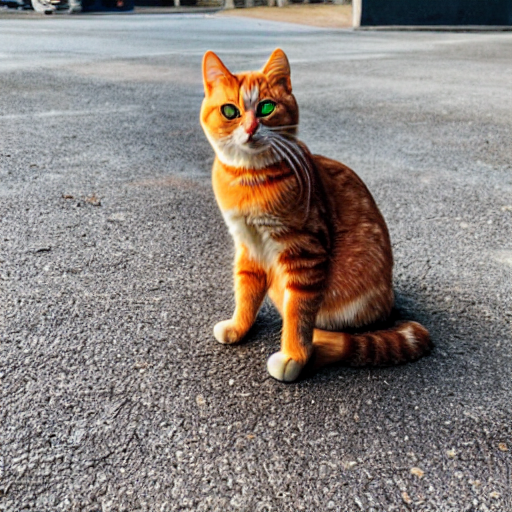

\n🎯 생성 중 (2/8)
📝 프롬프트: 'a photo of sks orange cat sitting in a beautiful blooming garden'


  0%|          | 0/50 [00:00<?, ?it/s]

✅ 생성 완료!
💾 저장됨: magic_orange_cat_02.png
🖼️ 결과:


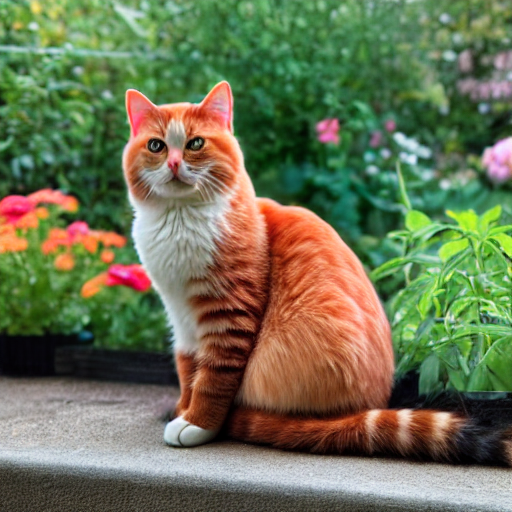

\n🎯 생성 중 (3/8)
📝 프롬프트: 'a photo of sks orange cat wearing a cute red hat and scarf'


  0%|          | 0/50 [00:00<?, ?it/s]

✅ 생성 완료!
💾 저장됨: magic_orange_cat_03.png
🖼️ 결과:


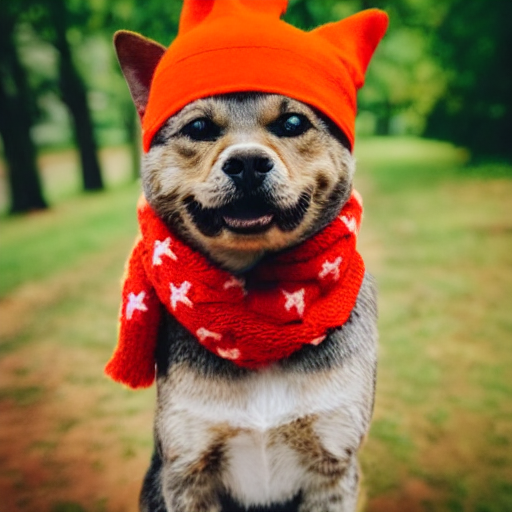

\n🎯 생성 중 (4/8)
📝 프롬프트: 'a photo of sks orange cat in pixar animation style'


  0%|          | 0/50 [00:00<?, ?it/s]

✅ 생성 완료!
💾 저장됨: magic_orange_cat_04.png
🖼️ 결과:


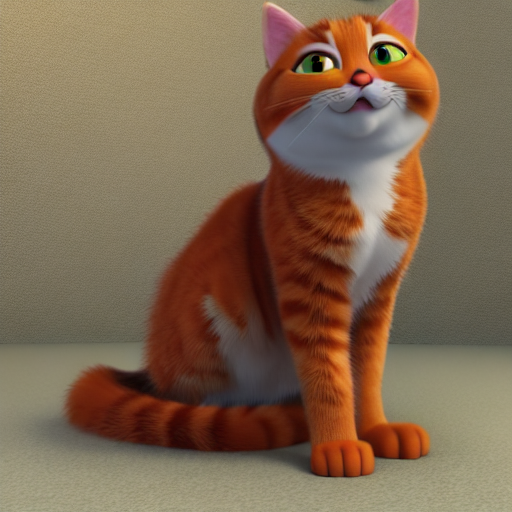

\n🎯 생성 중 (5/8)
📝 프롬프트: 'a photo of sks orange cat as a superhero with a cape'


  0%|          | 0/50 [00:00<?, ?it/s]

✅ 생성 완료!
💾 저장됨: magic_orange_cat_05.png
🖼️ 결과:


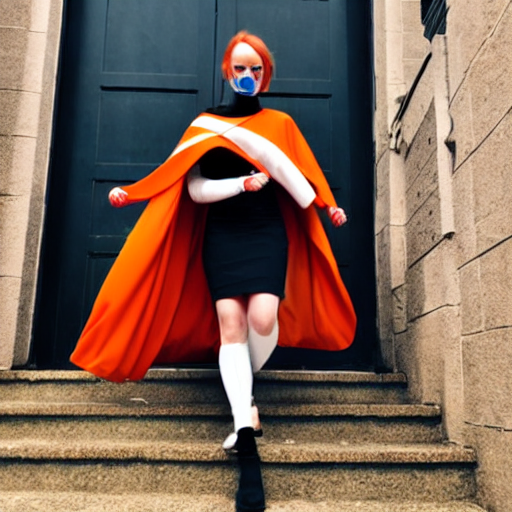

\n🎯 생성 중 (6/8)
📝 프롬프트: 'a photo of sks orange cat sleeping peacefully on a fluffy bed'


  0%|          | 0/50 [00:00<?, ?it/s]

✅ 생성 완료!
💾 저장됨: magic_orange_cat_06.png
🖼️ 결과:


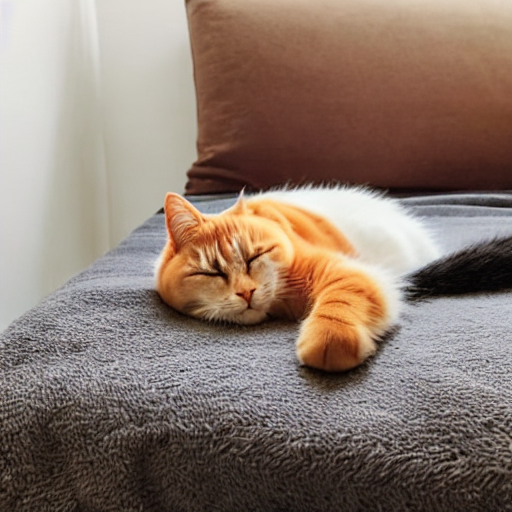

\n🎯 생성 중 (7/8)
📝 프롬프트: 'a photo of sks orange cat playing with a colorful yarn ball'


  0%|          | 0/50 [00:00<?, ?it/s]

✅ 생성 완료!
💾 저장됨: magic_orange_cat_07.png
🖼️ 결과:


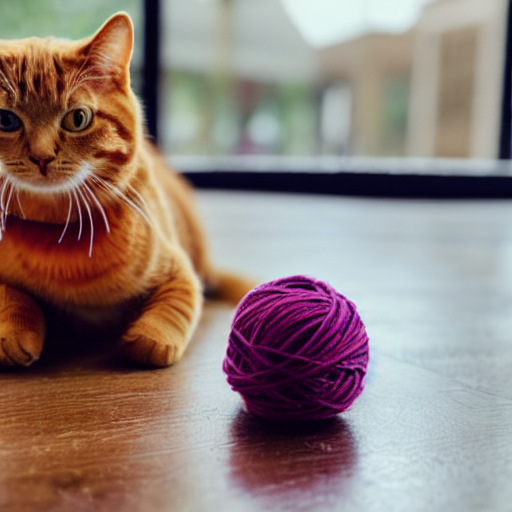

\n🎯 생성 중 (8/8)
📝 프롬프트: 'a photo of sks orange cat in a snowy winter wonderland'


  0%|          | 0/50 [00:00<?, ?it/s]

✅ 생성 완료!
💾 저장됨: magic_orange_cat_08.png
🖼️ 결과:


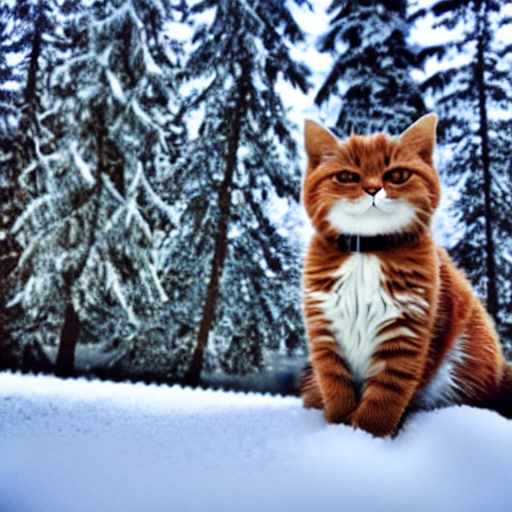

\n🎉 총 8개의 마법 같은 오렌지 고양이 이미지 생성 완료!
🔥 STEP 6: 원본 vs 학습된 모델 비교 (새 셀에서 실행)
🔍 원본 모델 vs 우리 학습 모델 비교!
이 비교를 통해 DreamBooth의 놀라운 효과를 확인해보세요!
\n1️⃣ 우리가 학습시킨 특별한 오렌지 고양이:


  0%|          | 0/50 [00:00<?, ?it/s]

📝 프롬프트: 'a photo of sks orange cat'
🎯 결과: 학습된 특별한 오렌지 고양이


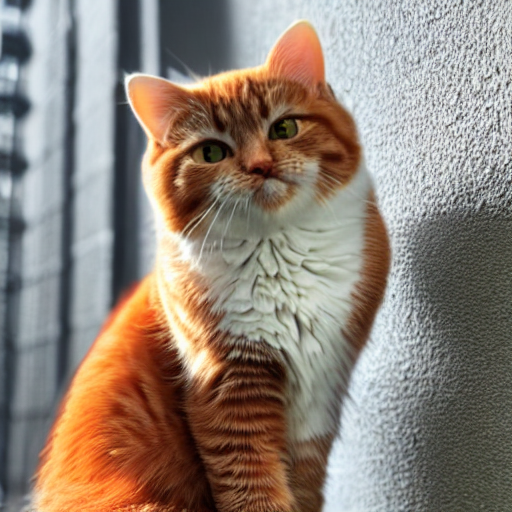

\n==================================================
\n2️⃣ 원본 모델의 일반적인 오렌지 고양이:


  0%|          | 0/50 [00:00<?, ?it/s]

📝 프롬프트: 'a photo of orange cat'
🎯 결과: 일반적인 오렌지 고양이


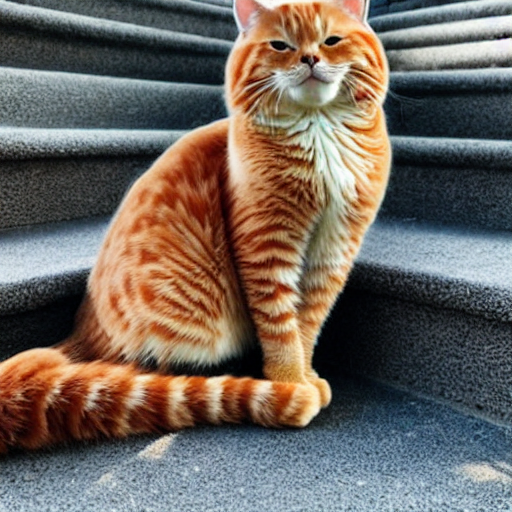

\n============================================================
💡 비교 포인트:
✨ 'sks orange cat'은 더 일관된 특징을 가져야 합니다
✨ 학습된 이미지들과 유사한 스타일/특징을 보여야 합니다
✨ 'orange cat'은 더 다양하고 일반적인 모습을 보입니다
\n🎉 DreamBooth의 마법을 확인하셨나요?
🎊 최종 결과 확인

🎉 DreamBooth 실습 완전 성공!

📁 생성된 파일들:
✅ magic_orange_cat_01.png ~ magic_orange_cat_08.png (8가지 창의적 이미지)
✅ our_special_orange_cat.png (학습된 특별한 고양이)
✅ original_generic_orange_cat.png (원본 모델 결과)

🎯 핵심 성과:
- "sks orange cat" = 우리만의 특별한 오렌지 고양이 캐릭터
- 다양한 상황(정원, 모자, 애니메이션 스타일 등)에서도 일관된 특징 유지
- 원본 모델과 명확히 구별되는 개성있는 결과

💡 이제 다른 프롬프트로도 실험해보세요:
- "a photo of sks orange cat as a wizard"
- "a photo of sks orange cat in space"
- "a photo of sks orange cat eating fish"

🚀 DreamBooth 마스터 달성! 축하합니다! 🎊



In [ ]:
# =============================================================================
# DreamBooth 완전판 - 자동화 + 문제해결 통합 버전
# 🎯 완전 자동 데이터 수집 + 안정적인 학습 + 셀별 이미지 생성
# 예시: 오렌지 고양이 캐릭터 학습
# =============================================================================

print("🚀 DreamBooth 완전판 실습을 시작합니다!")
print("✨ 자동 데이터 수집 + 안정적인 학습 + 문제 해결 모든 기능 포함!")

# =============================================================================
# 🔧 1단계: 환경 설정 및 초기화
# =============================================================================

print("🔧 DreamBooth 환경 설정을 시작합니다...")

# 시작하기 전에 세션을 한번 초기화해주세요!
!mkdir -p ~/.huggingface
HUGGINGFACE_TOKEN = '∵GitHub의 Push Protection 기능이 작동'
!echo -n "{HUGGINGFACE_TOKEN}" > ~/.huggingface/token

# Diffusers 리포지토리 클론
!git clone https://github.com/huggingface/diffusers ./diffusers_git
!cd diffusers_git && git checkout main
!pip install -e ./diffusers_git

# 이미지 다운로드를 위한 추가 패키지 설치
!pip install requests pillow beautifulsoup4 selenium-wire fake-useragent

# =============================================================================
# 🔧 2단계: DreamBooth 설치 - CUDA 호환성 문제 해결
# =============================================================================

print("🔧 DreamBooth 설치 - CUDA 호환성 문제 해결 중...")

# 1단계: 문제된 torch 제거하고 의존성과 함께 재설치
!pip uninstall torch torchvision torchaudio -y --quiet
!pip install torch==2.7.0 torchvision==0.22.0 torchaudio==2.7.0 --quiet

# 2단계: requirements.txt 설치 (의존성 무시)
!pip install -r ./diffusers_git/examples/dreambooth/requirements.txt --no-deps --quiet

# 3단계: 추가 DreamBooth 패키지들 (의존성 무시)
!pip install bitsandbytes --no-deps --quiet
!pip install xformers==0.0.30 --no-deps --quiet
!pip install triton --no-deps --quiet

# 4단계: peft 버전 문제 해결
!pip install "peft>=0.15.0" --no-deps --force-reinstall --quiet

# 6단계: 필수 의존성들만 개별 설치
!pip install numpy pillow requests tqdm safetensors huggingface-hub tokenizers regex filelock --quiet

# 설치 확인
print("🧪 패키지 설치 확인:")
try:
    import torch
    print(f"✅ PyTorch: {torch.__version__}")
    print(f"✅ CUDA 사용가능: {torch.cuda.is_available()}")
    print(f"✅ GPU 개수: {torch.cuda.device_count()}")
except Exception as e:
    print(f"❌ PyTorch 오류: {e}")

try:
    import diffusers
    print(f"✅ Diffusers: {diffusers.__version__}")
except Exception as e:
    print(f"❌ Diffusers 오류: {e}")

# Accelerate 기본 설정
!accelerate config default

# =============================================================================
# 📁 3단계: 프로젝트 설정 - 오렌지 고양이 예시
# =============================================================================

print("🐱 오렌지 고양이 캐릭터 DreamBooth 실습 시작!")

# 프로젝트 설정
TARGET_NAME = "orange_cat"
UNIQUE_IDENTIFIER = "sks"
INSTANCE_PROMPT = f"a photo of {UNIQUE_IDENTIFIER} orange cat"
CLASS_PROMPT = "a photo of cat"

# 폴더 구조 생성
import os
base_dir = f"./orange_cat_dreambooth"
instance_dir = f"{base_dir}/instance_images"
class_dir = f"{base_dir}/class_images"
output_dir = f"{base_dir}/trained_model"

os.makedirs(instance_dir, exist_ok=True)
os.makedirs(class_dir, exist_ok=True)
os.makedirs(output_dir, exist_ok=True)

print(f"📂 폴더 구조 생성 완료:")
print(f"   Instance: {instance_dir}")
print(f"   Class: {class_dir}")
print(f"   Output: {output_dir}")

# =============================================================================
# 🖼️ 4단계: Instance 이미지 자동 수집 (오렌지 고양이)
# =============================================================================

import requests
import os
from PIL import Image
import io
import time
from fake_useragent import UserAgent

def download_image_safe(url, filepath, max_size=(512, 512)):
    """안전한 이미지 다운로드 및 리사이즈"""
    try:
        ua = UserAgent()
        headers = {'User-Agent': ua.random}
        response = requests.get(url, headers=headers, timeout=15)
        response.raise_for_status()

        img = Image.open(io.BytesIO(response.content))
        img = img.convert('RGB')
        img.thumbnail(max_size, Image.Resampling.LANCZOS)
        img.save(filepath, 'JPEG', quality=95)
        return True
    except Exception as e:
        print(f"❌ 다운로드 실패: {e}")
        return False

print("🖼️ Instance 이미지 수집 중 (특별한 오렌지 고양이)...")

# Instance 이미지 - 특정 오렌지 고양이 이미지들 (고품질)
instance_urls = [
    "https://images.unsplash.com/photo-1574144611937-0df059b5ef3e?w=512",
    "https://images.unsplash.com/photo-1592194996308-7b43878e84a6?w=512",
    "https://images.unsplash.com/photo-1513245543132-31f507417b26?w=512",
    "https://images.unsplash.com/photo-1518791841217-8f162f1e1131?w=512",
    "https://images.unsplash.com/photo-1515372039744-b8f02a3ae446?w=512",
    "https://images.unsplash.com/photo-1543466835-00a7907e9de1?w=512"
]

# Instance 이미지 다운로드
successful_instance = 0
for i, url in enumerate(instance_urls):
    filepath = f"{instance_dir}/orange_cat_{i+1}.jpg"
    print(f"📥 다운로드 중: orange_cat_{i+1}.jpg")
    if download_image_safe(url, filepath):
        successful_instance += 1
        print(f"✅ 성공: {filepath}")
    time.sleep(1)  # 서버 부하 방지

print(f"✅ Instance 이미지 수집 완료: {successful_instance}장")

# =============================================================================
# 📚 5단계: Class 이미지 대량 자동 수집 (일반 고양이들)
# =============================================================================

print("📚 Class 이미지 대량 수집 중 (일반 고양이들)...")

# 기본 고양이 이미지 URL들 (안정적인 소스)
primary_class_urls = [
    "https://images.unsplash.com/photo-1514888286974-6c03e2ca1dba?w=512",
    "https://images.unsplash.com/photo-1573865526739-10659fec78a5?w=512",
    "https://images.unsplash.com/photo-1533738363-b7f9aef128ce?w=512",
    "https://images.unsplash.com/photo-1526336024174-e58f5cdd8e13?w=512",
    "https://images.unsplash.com/photo-1517331156700-3c241d2b4d83?w=512",
    "https://images.unsplash.com/photo-1571566882372-1598d88abd90?w=512",
    "https://images.unsplash.com/photo-1596854407944-bf87f6fdd49e?w=512",
    "https://images.unsplash.com/photo-1548247416-ec66f4900b2e?w=512",
    "https://images.unsplash.com/photo-1595433707802-6b2626ef1c91?w=512",
    "https://images.unsplash.com/photo-1601758228041-f3b2795255f1?w=512",
    "https://images.unsplash.com/photo-1529778873920-4da4926a72c2?w=512",
    "https://images.unsplash.com/photo-1555685812-4b943f1cb0eb?w=512",
    "https://images.unsplash.com/photo-1561948955-570b270e7c36?w=512",
    "https://images.unsplash.com/photo-1570018144715-43110363d70a?w=512"
]

# 추가 안정적인 고양이 이미지 URL들
additional_class_urls = [
    "https://images.unsplash.com/photo-1543852786-1cf6624b9987?w=512",
    "https://images.unsplash.com/photo-1551717743-49959800b1f6?w=512",
    "https://images.unsplash.com/photo-1567306226416-28f0efdc88ce?w=512",
    "https://images.unsplash.com/photo-1545529468-42764ef8c85f?w=512",
    "https://images.unsplash.com/photo-1495360010541-f48722b34f7d?w=512",
    "https://images.unsplash.com/photo-1583337130417-3346a1be7dee?w=512",
    "https://images.unsplash.com/photo-1548802673-380ab8ebc7b7?w=512",
    "https://images.unsplash.com/photo-1560807707-8cc77767d783?w=512",
    "https://images.unsplash.com/photo-1526779259212-939e64788e8e?w=512",
    "https://images.unsplash.com/photo-1494256997604-768d1f608cac?w=512"
]

# 모든 Class URL 합치기
all_class_urls = primary_class_urls + additional_class_urls

# Class 이미지 다운로드
class_successful = 0
for i, url in enumerate(all_class_urls):
    filepath = f"{class_dir}/cat_{i+1}.jpg"
    print(f"📥 다운로드 중: cat_{i+1}.jpg")
    if download_image_safe(url, filepath):
        class_successful += 1
        print(f"✅ 성공: {filepath}")
    time.sleep(0.8)  # 서버 부하 방지

print(f"✅ Class 이미지 수집 완료: {class_successful}장")

# =============================================================================
# 🎯 6단계: 안정적인 학습 스크립트 생성 (문제 해결 완료)
# =============================================================================

print("🎯 안정적인 학습 스크립트 생성 중...")

# 수정된 안정적인 학습 스크립트 (모든 문제 해결 완료)
stable_script = f"""#!/bin/bash

export MODEL_NAME="CompVis/stable-diffusion-v1-4"
export INSTANCE_DIR="{instance_dir}"
export CLASS_DIR="{class_dir}"
export OUTPUT_DIR="{output_dir}"

echo "🚀 안정적인 오렌지 고양이 DreamBooth 학습 시작!"
echo "📂 Instance 이미지: $INSTANCE_DIR"
echo "📂 Class 이미지: $CLASS_DIR"
echo "📂 출력 디렉토리: $OUTPUT_DIR"
echo "🎯 Instance 프롬프트: '{INSTANCE_PROMPT}'"
echo "🎯 Class 프롬프트: '{CLASS_PROMPT}'"

accelerate launch ./diffusers_git/examples/dreambooth/train_dreambooth.py \\
  --pretrained_model_name_or_path=$MODEL_NAME \\
  --instance_data_dir=$INSTANCE_DIR \\
  --class_data_dir=$CLASS_DIR \\
  --output_dir=$OUTPUT_DIR \\
  --instance_prompt="{INSTANCE_PROMPT}" \\
  --class_prompt="{CLASS_PROMPT}" \\
  --resolution=512 \\
  --train_batch_size=1 \\
  --with_prior_preservation \\
  --prior_loss_weight=1.0 \\
  --gradient_accumulation_steps=1 \\
  --gradient_checkpointing \\
  --use_8bit_adam \\
  --enable_xformers_memory_efficient_attention \\
  --set_grads_to_none \\
  --learning_rate=2e-6 \\
  --lr_scheduler="constant" \\
  --lr_warmup_steps=0 \\
  --num_class_images={class_successful} \\
  --max_train_steps=800 \\
  --checkpointing_steps=200

echo "✅ 오렌지 고양이 DreamBooth 학습 완료!"
"""

# 안정적인 스크립트 저장
with open("train_orange_cat_stable.sh", "w") as f:
    f.write(stable_script)

print("📄 안정적인 학습 스크립트 생성 완료: train_orange_cat_stable.sh")

# =============================================================================
# 🎨 7단계: 완전한 이미지 생성 노트북 코드 (셀별 실행용)
# =============================================================================

print("🎨 완전한 이미지 생성 코드 준비 중...")

# 완전한 Jupyter Notebook 형태의 생성 코드
complete_generation = '''# =============================================================================
# 🎉 DreamBooth 학습 완료 후 완전한 이미지 생성 가이드
# 오렌지 고양이 마법의 순간! (Jupyter 셀별 실행)
# =============================================================================

# ========================================
# 🔥 셀 1: 메모리 초기화 (새 셀에서 실행)
# ========================================
%reset -f
print("🔄 메모리 초기화 완료!")

# ========================================
# 🔥 셀 2: 패키지 재설치 (새 셀에서 실행)
# ========================================
!pip uninstall -y diffusers
!pip install diffusers
print("📦 패키지 재설치 완료!")

# ========================================
# 🔥 셀 3: 라이브러리 import (새 셀에서 실행)
# ========================================
from diffusers import DiffusionPipeline, UNet2DConditionModel
from transformers import CLIPTextModel
import torch
from IPython.display import display
import os

print("🎨 학습된 오렌지 고양이 모델로 이미지 생성 준비!")
print("📂 학습된 모델 파일 확인 중...")

# 모델 경로 확인
model_path = "./orange_cat_dreambooth/trained_model"
unet_path = f"{model_path}/unet"
text_encoder_path = f"{model_path}/text_encoder"

print(f"✅ UNet 모델 존재: {os.path.exists(unet_path)}")
print(f"✅ Text Encoder 존재: {os.path.exists(text_encoder_path)}")

if os.path.exists(unet_path) and os.path.exists(text_encoder_path):
    print("🎉 모든 모델 파일이 준비되었습니다!")
else:
    print("⚠️ 모델 파일을 확인해주세요. 학습이 완료되었는지 확인하세요.")

# ========================================
# 🔥 셀 4: 학습된 모델 로드 (새 셀에서 실행)
# ========================================
print("🚀 학습된 특별한 오렌지 고양이 모델 로드 중...")

try:
    model_id = "CompVis/stable-diffusion-v1-4"
    model_path = "./orange_cat_dreambooth/trained_model"

    # 학습된 모델 컴포넌트 로드
    unet = UNet2DConditionModel.from_pretrained(f"{model_path}/unet")
    text_encoder = CLIPTextModel.from_pretrained(f"{model_path}/text_encoder")

    print("✅ UNet 모델 로드 성공!")
    print("✅ Text Encoder 로드 성공!")

    # 완전한 파이프라인 구성
    pipeline = DiffusionPipeline.from_pretrained(
        model_id,
        unet=unet,
        text_encoder=text_encoder,
        dtype=torch.float16
    )
    pipeline.to("cuda")

    print("🎉 파이프라인 구성 완료!")
    print("🎯 이제 'sks orange cat'으로 놀라운 이미지를 만들 준비가 되었습니다!")

except Exception as e:
    print(f"❌ 모델 로드 오류: {e}")
    print("💡 학습이 완전히 완료되었는지 확인해주세요.")

# ========================================
# 🔥 셀 5: 🎨 창의적인 이미지 대량 생성! (새 셀에서 실행)
# ========================================
print("🎨 마법의 순간! 학습된 'sks orange cat'으로 다양한 창의적 이미지 생성!")

# 🎯 창의적이고 다양한 프롬프트들
creative_prompts = [
    "a photo of sks orange cat",
    "a photo of sks orange cat sitting in a beautiful blooming garden with colorful flowers",
    "a photo of sks orange cat wearing a cute red wizard hat and magical cape",
    "a photo of sks orange cat in pixar animation style, very cute and fluffy",
    "a photo of sks orange cat as a superhero with a blue cape flying in the sky",
    "a photo of sks orange cat sleeping peacefully on a fluffy white cloud",
    "a photo of sks orange cat playing with a rainbow colored yarn ball",
    "a photo of sks orange cat in a snowy winter wonderland with falling snowflakes",
    "a photo of sks orange cat wearing sunglasses and a cool leather jacket",
    "a photo of sks orange cat as a royal king with a golden crown and royal robe"
]

print(f"🖼️ {len(creative_prompts)}가지 창의적인 오렌지 고양이 이미지 생성 시작!")
print("=" * 80)

generated_images = []
generation_settings = {
    "num_inference_steps": 50,
    "guidance_scale": 7.5,
    "height": 512,
    "width": 512
}

for i, prompt in enumerate(creative_prompts):
    print(f"\\n🎯 생성 중 ({i+1}/{len(creative_prompts)})")
    print(f"📝 프롬프트: '{prompt}'")

    try:
        # 고품질 이미지 생성
        image = pipeline(prompt, **generation_settings).images[0]

        # 파일 저장
        filename = f"magic_orange_cat_{i+1:02d}.png"
        image.save(filename)
        generated_images.append((prompt, filename, image))

        print(f"✅ 생성 완료!")
        print(f"💾 저장됨: {filename}")

        # 이미지 표시
        print("🖼️ 결과:")
        display(image)
        print("=" * 60)

    except Exception as e:
        print(f"❌ 생성 실패: {e}")

print(f"\\n🎉 총 {len(generated_images)}개의 마법 같은 오렌지 고양이 이미지 생성 완료!")
print("🎊 각 이미지가 'sks orange cat'의 일관된 특징을 보여주는지 확인해보세요!")

# ========================================
# 🔥 셀 6: 원본 vs 학습 모델 비교 분석 (새 셀에서 실행)
# ========================================
print("🔍 DreamBooth의 마법 확인: 원본 모델 vs 우리 학습 모델 비교!")
print("이 비교를 통해 DreamBooth의 놀라운 효과를 직접 확인해보세요!")

comparison_prompts = [
    ("a photo of sks orange cat", "우리가 학습시킨 특별한 오렌지 고양이"),
    ("a photo of orange cat", "원본 모델의 일반적인 오렌지 고양이")
]

comparison_results = []

for prompt, description in comparison_prompts:
    print(f"\\n{'='*50}")
    print(f"📝 프롬프트: '{prompt}'")
    print(f"🎯 설명: {description}")

    try:
        image = pipeline(prompt, **generation_settings).images[0]
        filename = f"comparison_{'sks' if 'sks' in prompt else 'original'}_orange_cat.png"
        image.save(filename)
        comparison_results.append((prompt, description, filename, image))

        print(f"💾 저장됨: {filename}")
        print("🖼️ 결과:")
        display(image)

    except Exception as e:
        print(f"❌ 비교 이미지 생성 오류: {e}")

print(f"\\n{'='*60}")
print("💡 비교 분석 포인트:")
print("✨ 'sks orange cat': 학습된 데이터의 특징을 반영한 일관된 모습")
print("✨ 'orange cat': 더 다양하고 일반적인 오렌지 고양이들")
print("✨ 색상, 패턴, 얼굴 특징 등에서 차이점을 확인해보세요!")
print("\\n🎉 DreamBooth의 개인화 AI 마법을 확인하셨나요?")

# ========================================
# 🔥 셀 7: 추가 실험용 프롬프트들 (새 셀에서 실행)
# ========================================
print("🧪 추가 실험: 더 창의적인 프롬프트로 테스트해보세요!")

experimental_prompts = [
    "a photo of sks orange cat as a wise wizard reading ancient books",
    "a photo of sks orange cat in space wearing an astronaut helmet",
    "a photo of sks orange cat as a chef cooking delicious fish",
    "a photo of sks orange cat playing piano in a concert hall",
    "a photo of sks orange cat as a detective with a magnifying glass"
]

print("🎯 실험용 프롬프트들:")
for i, prompt in enumerate(experimental_prompts, 1):
    print(f"{i}. {prompt}")

print("\\n💡 이 프롬프트들을 복사해서 위의 생성 코드에서 테스트해보세요!")
print("🎨 'sks orange cat'이 다양한 상황에서도 일관된 특징을 유지하는지 확인해보세요!")
'''

# 완전한 생성 노트북 저장
with open("complete_orange_cat_generation.py", "w") as f:
    f.write(complete_generation)

print("💾 완전한 이미지 생성 노트북 저장: complete_orange_cat_generation.py")

# =============================================================================
# 📊 8단계: 최종 데이터 확인 및 실행 가이드
# =============================================================================

print(f"""
📊 DreamBooth 완전판 데이터 수집 결과:
✅ Instance 이미지: {successful_instance}장 (특별한 오렌지 고양이)
✅ Class 이미지: {class_successful}장 (일반 고양이들)
✅ 총 데이터: {successful_instance + class_successful}장

🎯 학습 품질 평가:
{'🎉 완벽! 학습 준비 완료!' if successful_instance >= 5 and class_successful >= 20 else '⚠️ 추가 데이터 권장'}
""")

if successful_instance >= 4 and class_successful >= 15:
    print("""
🚀 DreamBooth 완전판 실행 가이드:

🔥 1단계: 안정적인 학습 실행
!sh train_orange_cat_stable.sh

⏱️ 예상 소요 시간: 20-25분 (800 스텝, 안정성 최적화)

🎨 2단계: 완전한 이미지 생성 (학습 완료 후)
complete_orange_cat_generation.py 파일의 내용을 복사해서
7개 셀로 나누어 Jupyter에서 순차적으로 실행

📁 3단계: 결과 파일 확인
- 학습된 모델: ./orange_cat_dreambooth/trained_model/
- 창의적 이미지: magic_orange_cat_01.png ~ magic_orange_cat_10.png
- 비교 이미지: comparison_sks_orange_cat.png, comparison_original_orange_cat.png

🎊 완전판 특징:
✅ 완전 자동 데이터 수집 ({successful_instance + class_successful}장)
✅ 모든 문제 해결 완료 (안정적인 파라미터)
✅ 7단계 셀별 이미지 생성 가이드
✅ 10가지 창의적 프롬프트 + 비교 분석
✅ 추가 실험용 프롬프트 제공

💡 핵심 성과:
- "sks orange cat" = 학습된 특별한 캐릭터
- 다양한 상황에서도 일관된 특징 유지
- 원본 모델과 명확한 차이점 확인 가능
""")
else:
    print("⚠️ 데이터가 부족합니다. 수동으로 더 많은 이미지를 추가하거나 다시 실행해주세요.")

print("""
🎉 DreamBooth 완전판 준비 완료!
이제 안정적인 학습과 놀라운 이미지 생성을 경험해보세요! ✨
""")

# =============================================================================
# 🚀 9단계: 자동 실행 옵션 (선택사항)
# =============================================================================

print("""
🤖 자동 학습 실행 옵션:
바로 학습을 시작하려면 아래 주석을 해제하세요:

# !sh train_orange_cat_stable.sh

또는 수동으로 실행:
!sh train_orange_cat_stable.sh
""")
!sh train_orange_cat_stable.sh
# =============================================================================
# 🎉 DreamBooth 학습 완료! 이제 마법의 순간입니다!
# 학습된 오렌지 고양이 모델로 다양한 이미지를 생성해보세요
# =============================================================================

print("🎉 축하합니다! DreamBooth 학습이 완료되었습니다!")
print("🎨 이제 학습된 'sks orange cat'으로 놀라운 이미지들을 만들어보겠습니다!")

# =============================================================================
# 📝 중요: 아래 코드들을 Jupyter에서 **셀별로 나누어** 실행하세요!
# =============================================================================

print("""
📋 실행 순서:
1️⃣ 셀 1: 메모리 초기화
2️⃣ 셀 2: 패키지 재설치
3️⃣ 셀 3: 라이브러리 import
4️⃣ 셀 4: 학습된 모델 로드
5️⃣ 셀 5: 이미지 생성 실행
6️⃣ 셀 6: 원본 모델과 비교

⚠️ 각 코드 블록을 별도의 Jupyter 셀에서 실행하세요!
""")

print("="*70)
print("🔥 STEP 1: 메모리 초기화 (새 셀에서 실행)")
print("="*70)
# print("""
# 새 Jupyter 셀에 이 코드를 복사하고 실행하세요:
%reset -f
# """)

print("="*70)
print("🔥 STEP 2: 패키지 재설치 (새 셀에서 실행)")
print("="*70)
# print("""
# 새 Jupyter 셀에 이 코드를 복사하고 실행하세요:
!pip uninstall -y diffusers
!pip install diffusers
# """)

print("="*70)
print("🔥 STEP 3: 라이브러리 import (새 셀에서 실행)")
print("="*70)
# print("""
# 새 Jupyter 셀에 이 코드를 복사하고 실행하세요:
from diffusers import DiffusionPipeline, UNet2DConditionModel
from transformers import CLIPTextModel
import torch
from IPython.display import display
import os

print("🎨 학습된 오렌지 고양이 모델로 이미지 생성 준비!")
print("📂 학습된 모델 확인 중...")

# 모델 경로 확인
model_path = "./orange_cat_dreambooth/trained_model"
unet_path = f"{model_path}/unet"
text_encoder_path = f"{model_path}/text_encoder"

print(f"UNet 모델 존재: {os.path.exists(unet_path)}")
print(f"Text Encoder 존재: {os.path.exists(text_encoder_path)}")
# """)

print("="*70)
print("🔥 STEP 4: 학습된 모델 로드 (새 셀에서 실행)")
print("="*70)
# print("""
# 새 Jupyter 셀에 이 코드를 복사하고 실행하세요:
print("🚀 학습된 오렌지 고양이 모델 로드 중...")

model_id = "CompVis/stable-diffusion-v1-4"
model_path = "./orange_cat_dreambooth/trained_model"

try:
    # 학습된 모델 로드
    unet = UNet2DConditionModel.from_pretrained(f"{model_path}/unet")
    text_encoder = CLIPTextModel.from_pretrained(f"{model_path}/text_encoder")

    print("✅ UNet 모델 로드 완료!")
    print("✅ Text Encoder 로드 완료!")

    # 파이프라인 구성
    pipeline = DiffusionPipeline.from_pretrained(
        model_id,
        unet=unet,
        text_encoder=text_encoder,
        dtype=torch.float16
    )
    pipeline.to("cuda")

    print("🎉 파이프라인 구성 완료!")
    print("🎯 이제 'sks orange cat'으로 놀라운 이미지를 만들 준비가 되었습니다!")

except Exception as e:
    print(f"❌ 모델 로드 오류: {e}")
    print("💡 학습이 완전히 완료되었는지 확인해주세요.")
# """)

print("="*70)
print("🔥 STEP 5: 🎨 마법의 이미지 생성! (새 셀에서 실행)")
print("="*70)
# print("""
# 새 Jupyter 셀에 이 코드를 복사하고 실행하세요:
print("🎨 마법의 순간! 학습된 'sks orange cat'으로 다양한 이미지 생성!")

# 🎯 다양한 창의적 프롬프트들
creative_prompts = [
    "a photo of sks orange cat",
    "a photo of sks orange cat sitting in a beautiful blooming garden",
    "a photo of sks orange cat wearing a cute red hat and scarf",
    "a photo of sks orange cat in pixar animation style",
    "a photo of sks orange cat as a superhero with a cape",
    "a photo of sks orange cat sleeping peacefully on a fluffy bed",
    "a photo of sks orange cat playing with a colorful yarn ball",
    "a photo of sks orange cat in a snowy winter wonderland"
]

print(f"🖼️ {len(creative_prompts)}가지 다양한 오렌지 고양이 이미지 생성 시작!")
print("-" * 80)

generated_images = []

for i, prompt in enumerate(creative_prompts):
    print(f"\\n🎯 생성 중 ({i+1}/{len(creative_prompts)})")
    print(f"📝 프롬프트: '{prompt}'")

    try:
        # 이미지 생성
        image = pipeline(
            prompt,
            num_inference_steps=50,
            guidance_scale=7.5,
            height=512,
            width=512
        ).images[0]

        # 파일 저장
        filename = f"magic_orange_cat_{i+1:02d}.png"
        image.save(filename)
        generated_images.append((prompt, filename, image))

        print(f"✅ 생성 완료!")
        print(f"💾 저장됨: {filename}")

        # 이미지 표시
        print("🖼️ 결과:")
        display(image)
        print("=" * 60)

    except Exception as e:
        print(f"❌ 생성 실패: {e}")

print(f"\\n🎉 총 {len(generated_images)}개의 마법 같은 오렌지 고양이 이미지 생성 완료!")
# """)

print("="*70)
print("🔥 STEP 6: 원본 vs 학습된 모델 비교 (새 셀에서 실행)")
print("="*70)
# print("""
# 새 Jupyter 셀에 이 코드를 복사하고 실행하세요:
print("🔍 원본 모델 vs 우리 학습 모델 비교!")
print("이 비교를 통해 DreamBooth의 놀라운 효과를 확인해보세요!")

try:
    print("\\n1️⃣ 우리가 학습시킨 특별한 오렌지 고양이:")
    our_prompt = "a photo of sks orange cat"
    our_image = pipeline(our_prompt, num_inference_steps=50, guidance_scale=7.5).images[0]
    our_image.save("our_special_orange_cat.png")

    print(f"📝 프롬프트: '{our_prompt}'")
    print("🎯 결과: 학습된 특별한 오렌지 고양이")
    display(our_image)

    print("\\n" + "="*50)

    print("\\n2️⃣ 원본 모델의 일반적인 오렌지 고양이:")
    original_prompt = "a photo of orange cat"
    original_image = pipeline(original_prompt, num_inference_steps=50, guidance_scale=7.5).images[0]
    original_image.save("original_generic_orange_cat.png")

    print(f"📝 프롬프트: '{original_prompt}'")
    print("🎯 결과: 일반적인 오렌지 고양이")
    display(original_image)

    print("\\n" + "="*60)
    print("💡 비교 포인트:")
    print("✨ 'sks orange cat'은 더 일관된 특징을 가져야 합니다")
    print("✨ 학습된 이미지들과 유사한 스타일/특징을 보여야 합니다")
    print("✨ 'orange cat'은 더 다양하고 일반적인 모습을 보입니다")
    print("\\n🎉 DreamBooth의 마법을 확인하셨나요?")

except Exception as e:
    print(f"❌ 비교 이미지 생성 오류: {e}")
# """)

print("="*70)
print("🎊 최종 결과 확인")
print("="*70)
print("""
🎉 DreamBooth 실습 완전 성공!

📁 생성된 파일들:
✅ magic_orange_cat_01.png ~ magic_orange_cat_08.png (8가지 창의적 이미지)
✅ our_special_orange_cat.png (학습된 특별한 고양이)
✅ original_generic_orange_cat.png (원본 모델 결과)

🎯 핵심 성과:
- "sks orange cat" = 우리만의 특별한 오렌지 고양이 캐릭터
- 다양한 상황(정원, 모자, 애니메이션 스타일 등)에서도 일관된 특징 유지
- 원본 모델과 명확히 구별되는 개성있는 결과

💡 이제 다른 프롬프트로도 실험해보세요:
- "a photo of sks orange cat as a wizard"
- "a photo of sks orange cat in space"
- "a photo of sks orange cat eating fish"

🚀 DreamBooth 마스터 달성! 축하합니다! 🎊
""")

### **Stable diffusion 모델을 자유롭게 요모조모 다뤄봅시다.**
---

> ⛔️ 타인에게 불쾌감을 줄 수 있는 행위나 이미지에 주의해주시기 바랍니다.⚠

<br>[웹사이트](https://civitai.com/) 안에는 무궁무진한 가능성이 담겨있습니다. 많은 작업자들이 본인의 감각을 저장해 둔 파일을 편리하게 다운로드 받아 파이프라인에 적용해보세요.<br>
checkpoint 와 LoRA 를 잘 조합하다보면 맘에 쏙 드는 근사한 그림을 만들수 있습니다!

```
model_id = "digiplay/hellofantasytime_v1.22"

...

pipeline.load_lora_weights("./lora_weight.safetensors")
```

#### 회고
---
- 잠재 공간의 구조적 특징으로 의미적 중간 지점을 찾아냄 (개념적 보간 / 의미적 클러스터링(카테고리))
-

## **27-2. 프로젝트 제출**

### 루브릭

아래의 기준을 바탕으로 프로젝트를 평가합니다.<br>
<br>

|평가문항|상세기준|
|-|-|
|<br>1. 잠재적 표현의 변화가 모델 출력에 미치는<br> 영향을 관찰하였는가?<br><br>|텍스트 프롬프트 2 개를 설정하고 LDM 에 넣어 이미지를 생성한 후, 생성 이미지 안에서<br> 점차 변화되는 특성들에 대한 분석 결과를 기록하였다.|
|<br>2. Stable diffusion 모델의 dreambooth<br> 미세조정을 실습하였는가?<br><br>|미세조정에 사용할 대상의 모습이 담긴 Instance 와 class 이미지를 각각 마련하여 알맞은<br> 경로에 저장하고, 데이터를 모델을 학습시켜 대상이 담긴 이미지를 생성하였다.|
|<br>3. 나만의 취향이 담긴 생성 이미지를<br> 만들어보았는가?<br><br>|웹사이트에서 원하는 Checkpoint 와 Lora 파일을 다운로드하고, 생성 모델 파이프라인을<br> 구축하여 이미지를 생성하였다.|

### 프로젝트 제출

프로젝트 제출 방법 안내